# Our World In Data - COVID 19 Dataset - DATA CLEANING AND EDA 

## Importing needed libraries

In [97]:
!pip install pycountry_convert

In [98]:
!pip install peakutils

In [99]:
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer
import pycountry_convert as pc
import seaborn as sns
from scipy.stats import zscore
from plotly.offline import init_notebook_mode, iplot, plot
import plotly.express as px
import peakutils
import matplotlib.style as style
import matplotlib.gridspec as gridspec
import scipy.stats as stats
import plotly.graph_objs as go
import plotly.offline as py
from scipy import stats
from scipy.stats import f_oneway
from scipy.stats import chi2_contingency

import matplotlib.pyplot as plt

## Importing our dataset from kaggle

In [100]:
df  = pd.read_csv('/kaggle/input/our-world-in-data-covid19-dataset/owid-covid-data.csv')

## Getting famaliar with the Dataset

In [101]:
df.shape

(350085, 67)

In [102]:
df.head()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2020-01-03,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-01-04,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
2,AFG,Asia,Afghanistan,2020-01-05,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
3,AFG,Asia,Afghanistan,2020-01-06,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
4,AFG,Asia,Afghanistan,2020-01-07,NaN,0.0,NaN,NaN,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN


In [103]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 350085 entries, 0 to 350084
Data columns (total 67 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   iso_code                                    350085 non-null  object 
 1   continent                                   333420 non-null  object 
 2   location                                    350085 non-null  object 
 3   date                                        350085 non-null  object 
 4   total_cases                                 312088 non-null  float64
 5   new_cases                                   340457 non-null  float64
 6   new_cases_smoothed                          339198 non-null  float64
 7   total_deaths                                290501 non-null  float64
 8   new_deaths                                  340511 non-null  float64
 9   new_deaths_smoothed                         339281 non-null  float64
 

In [104]:
df.describe()

,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
count,3.120880e+05,3.404570e+05,3.391980e+05,2.905010e+05,340511.000000,339281.000000,312088.000000,340457.000000,339198.000000,290501.000000,...,200889.000000,132973.000000,239669.000000,322072.000000,263138.000000,3.500850e+05,1.218400e+04,12184.000000,12184.000000,12184.000000
mean,6.683354e+06,9.601634e+03,9.637066e+03,8.602180e+04,85.511055,85.817071,101749.851259,145.163814,145.696924,872.289356,...,32.909483,50.789962,3.097245,73.713631,0.722464,1.284633e+08,5.281637e+04,9.738648,11.345256,1669.025575
std,4.068903e+07,1.102769e+05,9.447784e+04,4.398873e+05,613.687971,559.130004,151265.689121,1163.714678,599.957847,1100.189784,...,13.573767,31.956100,2.548327,7.395220,0.148976,6.607694e+08,1.492195e+05,12.304441,25.181297,1938.556228
min,1.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,7.700000,1.188000,0.100000,53.280000,0.394000,4.700000e+01,-3.772610e+04,-44.230000,-95.920000,-2752.924800
25%,8.090000e+03,0.000000e+00,2.860000e-01,1.270000e+02,0.000000,0.000000,2595.577500,0.000000,0.044000,60.606000,...,22.600000,20.859000,1.300000,69.590000,0.602000,4.490020e+05,1.202250e+02,1.400000,-1.600000,72.395046
50%,7.020500e+04,2.000000e+00,2.485700e+01,1.328000e+03,0.000000,0.143000,28307.659000,0.128000,6.517000,377.169000,...,33.100000,49.839000,2.500000,75.050000,0.740000,5.882259e+06,5.885850e+03,8.075000,5.720000,1105.404700
75%,7.409558e+05,2.640000e+02,4.978570e+02,1.192200e+04,3.000000,5.143000,133506.244000,35.466000,82.411000,1365.925000,...,41.300000,82.502000,4.200000,79.460000,0.829000,2.830170e+07,3.742344e+04,15.360000,16.302500,2740.130200
max,7.714071e+08,8.401961e+06,6.402036e+06,6.972139e+06,27939.000000,14822.000000,737554.506000,228872.025000,37241.781000,6511.209000,...,78.100000,100.000000,13.800000,86.750000,0.957000,7.975105e+09,1.289776e+06,76.620000,377.630000,10292.916000


In [105]:
all_columns = df.columns
all_columns

Index(['iso_code', 'continent', 'location', 'date', 'total_cases', 'new_cases',
       'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate', 'icu_patients',
       'icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'total_tests', 'new_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'tests_units', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated', 'total_boosters',
       'new_vaccinations', 'new_vaccinations_smoothed',
       't

## finding numerical and categorical features

In [106]:
numeric_columns = df.select_dtypes(include=['int', 'float']).columns
len(numeric_columns)

62

In [107]:
categoric_colimns = all_columns.drop(numeric_columns)
categoric_colimns

Index(['iso_code', 'continent', 'location', 'date', 'tests_units'], dtype='object')

In [108]:
df['iso_code'].unique()

array(['AFG', 'OWID_AFR', 'ALB', 'DZA', 'ASM', 'AND', 'AGO', 'AIA', 'ATG',
       'ARG', 'ARM', 'ABW', 'OWID_ASI', 'AUS', 'AUT', 'AZE', 'BHS', 'BHR',
       'BGD', 'BRB', 'BLR', 'BEL', 'BLZ', 'BEN', 'BMU', 'BTN', 'BOL',
       'BES', 'BIH', 'BWA', 'BRA', 'VGB', 'BRN', 'BGR', 'BFA', 'BDI',
       'KHM', 'CMR', 'CAN', 'CPV', 'CYM', 'CAF', 'TCD', 'CHL', 'CHN',
       'COL', 'COM', 'COG', 'COK', 'CRI', 'CIV', 'HRV', 'CUB', 'CUW',
       'CYP', 'CZE', 'COD', 'DNK', 'DJI', 'DMA', 'DOM', 'ECU', 'EGY',
       'SLV', 'OWID_ENG', 'GNQ', 'ERI', 'EST', 'SWZ', 'ETH', 'OWID_EUR',
       'OWID_EUN', 'FRO', 'FLK', 'FJI', 'FIN', 'FRA', 'GUF', 'PYF', 'GAB',
       'GMB', 'GEO', 'DEU', 'GHA', 'GIB', 'GRC', 'GRL', 'GRD', 'GLP',
       'GUM', 'GTM', 'GGY', 'GIN', 'GNB', 'GUY', 'HTI', 'OWID_HIC', 'HND',
       'HKG', 'HUN', 'ISL', 'IND', 'IDN', 'IRN', 'IRQ', 'IRL', 'IMN',
       'ISR', 'ITA', 'JAM', 'JPN', 'JEY', 'JOR', 'KAZ', 'KEN', 'KIR',
       'OWID_KOS', 'KWT', 'KGZ', 'LAO', 'LVA', 'LBN', 'LSO', 'LBR',

In [109]:
df['continent'].unique()

array(['Asia', nan, 'Europe', 'Africa', 'Oceania', 'North America',
       'South America'], dtype=object)

In [110]:
df['location'].unique()

array(['Afghanistan', 'Africa', 'Albania', 'Algeria', 'American Samoa',
       'Andorra', 'Angola', 'Anguilla', 'Antigua and Barbuda',
       'Argentina', 'Armenia', 'Aruba', 'Asia', 'Australia', 'Austria',
       'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh', 'Barbados',
       'Belarus', 'Belgium', 'Belize', 'Benin', 'Bermuda', 'Bhutan',
       'Bolivia', 'Bonaire Sint Eustatius and Saba',
       'Bosnia and Herzegovina', 'Botswana', 'Brazil',
       'British Virgin Islands', 'Brunei', 'Bulgaria', 'Burkina Faso',
       'Burundi', 'Cambodia', 'Cameroon', 'Canada', 'Cape Verde',
       'Cayman Islands', 'Central African Republic', 'Chad', 'Chile',
       'China', 'Colombia', 'Comoros', 'Congo', 'Cook Islands',
       'Costa Rica', "Cote d'Ivoire", 'Croatia', 'Cuba', 'Curacao',
       'Cyprus', 'Czechia', 'Democratic Republic of Congo', 'Denmark',
       'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt',
       'El Salvador', 'England', 'Equatorial Guinea', 'Eritrea',

In [111]:
df['date'].unique()

array(['2020-01-03', '2020-01-04', '2020-01-05', ..., '2023-10-22',
       '2023-10-23', '2023-10-24'], dtype=object)

In [112]:
df['tests_units'].unique()

array([nan, 'tests performed', 'units unclear', 'samples tested',
       'people tested'], dtype=object)

In [113]:
df.isna().sum()[:30]

iso_code                                   0
continent                              16665
location                                   0
date                                       0
total_cases                            37997
new_cases                               9628
new_cases_smoothed                     10887
total_deaths                           59584
new_deaths                              9574
new_deaths_smoothed                    10804
total_cases_per_million                37997
new_cases_per_million                   9628
new_cases_smoothed_per_million         10887
total_deaths_per_million               59584
new_deaths_per_million                  9574
new_deaths_smoothed_per_million        10804
reproduction_rate                     165268
icu_patients                          312470
icu_patients_per_million              312470
hosp_patients                         311183
hosp_patients_per_million             311183
weekly_icu_admissions                 339880
weekly_icu

In [114]:
df.isna().sum()[30:]

new_tests_smoothed_per_thousand               246120
positive_rate                                 254158
tests_per_case                                255737
tests_units                                   243297
total_vaccinations                            270777
people_vaccinated                             274174
people_fully_vaccinated                       277510
total_boosters                                302523
new_vaccinations                              284739
new_vaccinations_smoothed                     169367
total_vaccinations_per_hundred                270777
people_vaccinated_per_hundred                 274174
people_fully_vaccinated_per_hundred           277510
total_boosters_per_hundred                    302523
new_vaccinations_smoothed_per_million         169367
new_people_vaccinated_smoothed                169596
new_people_vaccinated_smoothed_per_hundred    169596
stringency_index                              152434
population_density                            

## Drop unnecessary features

In [115]:
columns_to_drop = ['iso_code', 'tests_units']
df = df.drop(columns=columns_to_drop)

## Dealing with null values

In [116]:
columns_with_null_values = df.columns[df.isnull().any()]
columns_with_null_values

Index(['continent', 'total_cases', 'new_cases', 'new_cases_smoothed',
       'total_deaths', 'new_deaths', 'new_deaths_smoothed',
       'total_cases_per_million', 'new_cases_per_million',
       'new_cases_smoothed_per_million', 'total_deaths_per_million',
       'new_deaths_per_million', 'new_deaths_smoothed_per_million',
       'reproduction_rate', 'icu_patients', 'icu_patients_per_million',
       'hosp_patients', 'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'total_tests', 'new_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated', 'total_boosters',
       'new_vaccinations', 'new_vaccinations_smoothed',
       'total_vaccinations_per_hundred', 'people_vaccinated_per

### Handling null values in categorical features

Continents:

In [117]:
def count_null_values(df, col_name):
    counter = df[col_name].isnull().sum()
    print(f'{counter} out of {len(df[col_name])} is NaN')

In [118]:
count_null_values(df, 'continent')

16665 out of 350085 is NaN


In [119]:
count_null_values(df, 'location')

0 out of 350085 is NaN


We decide to deal with nul-values using pycountry library which country is given and continent is returned beacause there is no missing value in country column.

In [120]:
def country_to_continent(country_name): 
    country_alpha2 = pc.country_name_to_country_alpha2(country_name)
    country_continent_code = pc.country_alpha2_to_continent_code(country_alpha2)
    country_continent_name = pc.convert_continent_code_to_continent_name(country_continent_code)
    return country_continent_name

In [121]:
country_to_continent('Afghanistan')

'Asia'

In [122]:
def check_location_value(loc_value):
    if loc_value in df['location'].values:
        print(f"The value {loc_value} is present in the 'location' column.")
    else:
        print(f"The value {loc_value} is not present in the 'location' column.")

In [123]:
check_location_value('Asia')

The value Asia is present in the 'location' column.


In [124]:
check_location_value('Europe')

The value Europe is present in the 'location' column.


In [125]:
check_location_value('Africa')

The value Africa is present in the 'location' column.


In [126]:
check_location_value('European Union')

The value European Union is present in the 'location' column.


In [127]:
check_location_value('High income')

The value High income is present in the 'location' column.


In [128]:
check_location_value('Low income')

The value Low income is present in the 'location' column.


In [129]:
check_location_value('Lower middle income')

The value Lower middle income is present in the 'location' column.


In [130]:
check_location_value('European Union')

The value European Union is present in the 'location' column.


In [131]:
check_location_value('North America')

The value North America is present in the 'location' column.


In [132]:
check_location_value('Oceania')

The value Oceania is present in the 'location' column.


In [133]:
check_location_value('South America')

The value South America is present in the 'location' column.


In [134]:
check_location_value('Upper middle income')

The value Upper middle income is present in the 'location' column.


In [135]:
check_location_value('World')

The value World is present in the 'location' column.


In [136]:
len(df[df['location'] == 'World'])

1390

In [137]:
len(df[df['location'] == 'Upper middle income'])

1390

In [138]:
len(df[df['location'] == 'Lower middle income'])

1390

In [139]:
len(df[df['location'] == 'Low income'])

1385

In [140]:
len(df[df['location'] == 'High income'])

1390

In [141]:
values_to_drop = ['High income', 'Low income', 'Lower middle income', 'Upper middle income', 'World']
df = df[~df['location'].isin(values_to_drop)]


In [142]:
def replacement_function(location):
    try:
        odd_country_names = []
        country_names_same_continent = ['Africa', 'Asia', 'Europe', 'North America', 'South America',
                                       'Oceania']
        if location in country_names_same_continent:
            return location
        elif location == 'European Union':
            return 'Europe'
        else :
            country_alpha2 = pc.country_name_to_country_alpha2(country_name)
            country_continent_code = pc.country_alpha2_to_continent_code(country_alpha2)
            country_continent_name = pc.convert_continent_code_to_continent_name(country_continent_code)
        
            return country_continent_name
    except Exception as e:
        # Handle exceptions, e.g., if the country name is not recognized
        print(f"Error processing location '{location}': {e}")
        return None

In [143]:
def fill_null_continents(df, replacement_function):
    for index, row in df[df['continent'].isnull()].iterrows():
        location = row['location']
        replacement_value = replacement_function(location)
        df.at[index, 'continent'] = replacement_value

In [144]:
fill_null_continents(df, replacement_function)

In [145]:
count_null_values(df, 'continent')

0 out of 343140 is NaN


Date:

In [146]:
df['date'] = pd.to_datetime(df['date'], format='%Y-%m-%d', errors='coerce')

In [147]:
df['date'].isna().sum()

0

### Handling null values in Numerical features

In [148]:
numeric_columns

Index(['total_cases', 'new_cases', 'new_cases_smoothed', 'total_deaths',
       'new_deaths', 'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate', 'icu_patients',
       'icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'total_tests', 'new_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated', 'total_boosters',
       'new_vaccinations', 'new_vaccinations_smoothed',
       'total_vaccinations_per_hundred', 'people_vaccinated_per_hundred',
  

for some cases its better to fill null value forward fill or backwardfill because the total and new cases or deaths are cumulative values, and they are likely to follow a temporal trend. Forward filling or backward filling missing values based on the order of the dates can capture the temporal progression of the disease.

stringency index: The stringency index is a measure of the strictness of government policies. These policies are typically consistent for a certain period. Therefore, forward filling or backward filling can be appropriate

In [149]:
features_to_impute_backwardfill = ['total_cases', 'new_cases','new_cases_smoothed', 'total_deaths',
                                   'new_deaths', 'new_deaths_smoothed',
                                   'stringency_index']

for feature in features_to_impute_backwardfill:
    df[feature].fillna(method='bfill', inplace=True)

In [150]:
df.isna().sum()[:30]

continent                                  0
location                                   0
date                                       0
total_cases                                0
new_cases                                  0
new_cases_smoothed                         0
total_deaths                               0
new_deaths                                 0
new_deaths_smoothed                        0
total_cases_per_million                37900
new_cases_per_million                   9608
new_cases_smoothed_per_million         10842
total_deaths_per_million               59449
new_deaths_per_million                  9554
new_deaths_smoothed_per_million        10759
reproduction_rate                     159399
icu_patients                          305525
icu_patients_per_million              305525
hosp_patients                         304238
hosp_patients_per_million             304238
weekly_icu_admissions                 332935
weekly_icu_admissions_per_million     332935
weekly_hos

'weekly_icu_admissions' and Related Features: Assuming that missing values in ICU and hospital admissions mean no admissions occurred during those weeks.

In [151]:
icu_features = ['weekly_icu_admissions', 'weekly_icu_admissions_per_million',
                'weekly_hosp_admissions', 'weekly_hosp_admissions_per_million']
for feature in icu_features:
    df[feature] = df[feature].fillna(0)


total_tests and new_tests: Forward fill for 'total_tests', filling with 0 for 'new_tests'.
because 'total_tests' is likely cumulative, and 'new_tests' can be 0 if no new tests are reported.

In [152]:
df['total_tests'] = df['total_tests'].fillna(method='ffill') 
df['new_tests'] = df['new_tests'].fillna(0) 

positive_rate and tests_per_case: Using the mean to maintain the central tendency of the data.

In [153]:
df['positive_rate'] = df['positive_rate'].fillna(df['positive_rate'].mean()) 
df['tests_per_case'] = df['tests_per_case'].fillna(df['tests_per_case'].mean())
df['total_tests'] = df['total_tests'].fillna(df['total_tests'].mean())
df['new_tests_smoothed'] = df['new_tests_smoothed'].fillna(df['new_tests_smoothed'].mean())

# vaccination_features: Assuming 0 vaccinations for the initial missing values (worst case).

In [154]:
vaccination_features = ['total_vaccinations', 'people_vaccinated', 'people_fully_vaccinated',
                         'total_boosters', 'new_vaccinations']
for feature in vaccination_features:
    df[feature] = df[feature].fillna(0) 


Reproduction Rate, ICU Patients, Hosp Patients: These values are continuous and may not follow a strict temporal trend. Imputing missing values with the mean or median helps to maintain the central tendency of the data without introducing drastic changes.

In [155]:
continuous_features = ['reproduction_rate', 'icu_patients', 'hosp_patients']
df[continuous_features] = df[continuous_features].fillna(df[continuous_features].mean())

Population Density, Median Age: Demographic and health metrics are often stable over time and might not have strong temporal patterns. Imputing missing values with the mean or median helps to maintain the central tendency.

In [156]:
demographic_health_metrics = ['population_density', 'median_age']
df[demographic_health_metrics] = df[demographic_health_metrics].fillna(df[demographic_health_metrics].mean())

In [157]:
demographic_health_features = ['aged_65_older', 'aged_70_older', 'gdp_per_capita',
                                'extreme_poverty', 'cardiovasc_death_rate', 'diabetes_prevalence',
                                'female_smokers', 'male_smokers', 'handwashing_facilities',
                                'hospital_beds_per_thousand', 'life_expectancy',
                                'human_development_index', 'excess_mortality_cumulative_absolute',
                                'excess_mortality_cumulative']
for feature in demographic_health_features:
    df[feature] = df[feature].fillna(df[feature].median()) 


Excess mortality metrics: This feature may not follow a strict temporal trend and could be influenced by various factors. Imputing missing values with the mean or median can be a reasonable approach.

In [158]:
excess_mortality_metrics = ['excess_mortality']
df[excess_mortality_metrics] = df[excess_mortality_metrics].fillna(df[excess_mortality_metrics].mean())

Testing and Vaccination Metrics: These metrics may have a smooth trend over time. Interpolation or regression imputation methods can be used to estimate missing values based on the overall trend in the data.

In [159]:
testing_metrics = ['total_tests', 'new_tests', 'total_vaccinations', 'people_vaccinated']
df[testing_metrics] = df[testing_metrics].interpolate()

I prefer to use mean strategy for the rest of features.

drop all of other features.

In [160]:
df = df.drop(columns=[ 'total_cases_per_million', 
              'new_cases_per_million', 'new_cases_smoothed_per_million', 'total_deaths_per_million',
              'new_deaths_per_million', 'new_deaths_smoothed_per_million', 'icu_patients_per_million',
             'hosp_patients_per_million', 'new_vaccinations_smoothed', 'total_vaccinations_per_hundred',
              'people_vaccinated_per_hundred', 'people_fully_vaccinated_per_hundred', 
              'total_boosters_per_hundred', 'new_vaccinations_smoothed_per_million',
              'new_people_vaccinated_smoothed','new_people_vaccinated_smoothed_per_hundred',
             'hosp_patients_per_million', 'excess_mortality_cumulative_per_million',
                     'total_tests_per_thousand', 'new_tests_per_thousand', 
                     'new_tests_smoothed_per_thousand'])

In [161]:
df.shape

(343140, 45)

In [162]:
df.isna().sum()[:30]

continent                               0
location                                0
date                                    0
total_cases                             0
new_cases                               0
new_cases_smoothed                      0
total_deaths                            0
new_deaths                              0
new_deaths_smoothed                     0
reproduction_rate                       0
icu_patients                            0
hosp_patients                           0
weekly_icu_admissions                   0
weekly_icu_admissions_per_million       0
weekly_hosp_admissions                  0
weekly_hosp_admissions_per_million      0
total_tests                             0
new_tests                               0
new_tests_smoothed                      0
positive_rate                           0
tests_per_case                          0
total_vaccinations                      0
people_vaccinated                       0
people_fully_vaccinated           

In [163]:
df.isna().sum()[30:]

aged_70_older                           0
gdp_per_capita                          0
extreme_poverty                         0
cardiovasc_death_rate                   0
diabetes_prevalence                     0
female_smokers                          0
male_smokers                            0
handwashing_facilities                  0
hospital_beds_per_thousand              0
life_expectancy                         0
human_development_index                 0
population                              0
excess_mortality_cumulative_absolute    0
excess_mortality_cumulative             0
excess_mortality                        0
dtype: int64

In [164]:
df.columns

Index(['continent', 'location', 'date', 'total_cases', 'new_cases',
       'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'reproduction_rate', 'icu_patients',
       'hosp_patients', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'total_tests', 'new_tests',
       'new_tests_smoothed', 'positive_rate', 'tests_per_case',
       'total_vaccinations', 'people_vaccinated', 'people_fully_vaccinated',
       'total_boosters', 'new_vaccinations', 'stringency_index',
       'population_density', 'median_age', 'aged_65_older', 'aged_70_older',
       'gdp_per_capita', 'extreme_poverty', 'cardiovasc_death_rate',
       'diabetes_prevalence', 'female_smokers', 'male_smokers',
       'handwashing_facilities', 'hospital_beds_per_thousand',
       'life_expectancy', 'human_development_index', 'population',
       'excess_mortality_cumulative_absolute', 'excess_mortality_cum

## Handling Outliers

### Visual Inspection:

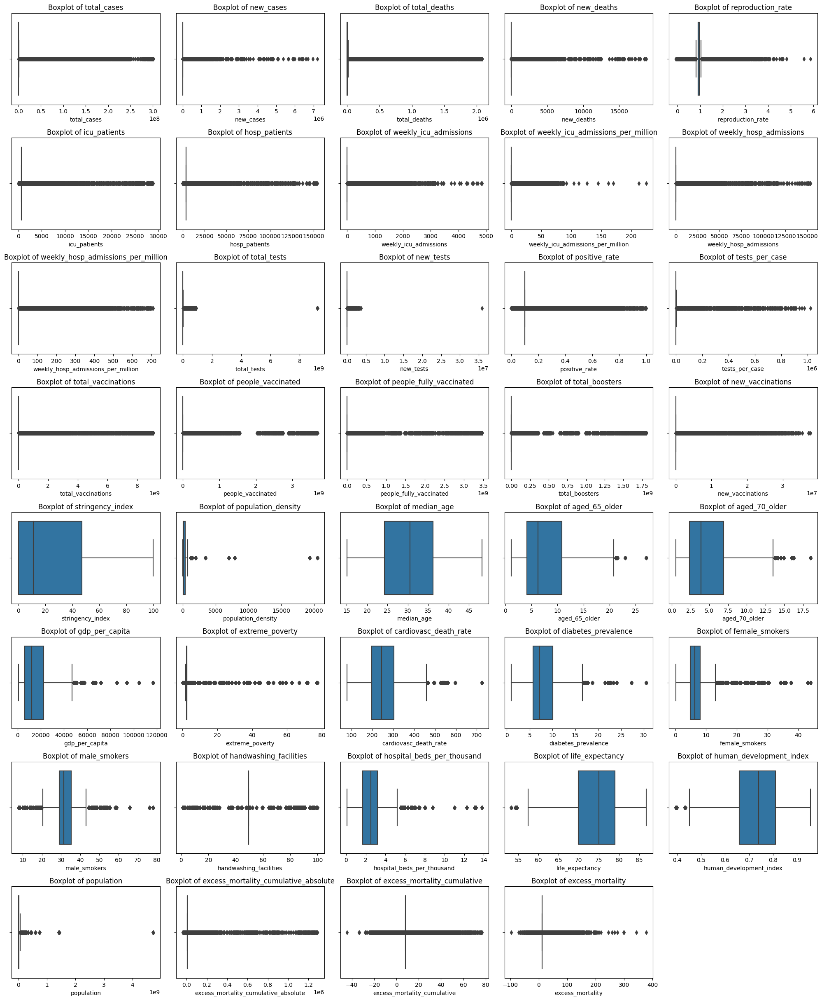

In [165]:
columns_to_plot = ['total_cases', 'new_cases', 'total_deaths', 'new_deaths',
                    'reproduction_rate', 'icu_patients', 'hosp_patients',
                    'weekly_icu_admissions', 'weekly_icu_admissions_per_million',
                    'weekly_hosp_admissions', 'weekly_hosp_admissions_per_million',
                    'total_tests', 'new_tests', 'positive_rate', 'tests_per_case',
                    'total_vaccinations', 'people_vaccinated', 'people_fully_vaccinated',
                    'total_boosters', 'new_vaccinations', 'stringency_index',
                    'population_density', 'median_age', 'aged_65_older', 'aged_70_older',
                    'gdp_per_capita', 'extreme_poverty', 'cardiovasc_death_rate',
                    'diabetes_prevalence', 'female_smokers', 'male_smokers',
                    'handwashing_facilities', 'hospital_beds_per_thousand',
                    'life_expectancy', 'human_development_index', 'population',
                    'excess_mortality_cumulative_absolute', 'excess_mortality_cumulative',
                    'excess_mortality']

plt.figure(figsize=(20, 30))

for i, column in enumerate(columns_to_plot, 1):
    plt.subplot(10, 5, i)
    sns.boxplot(x=df[column])
    plt.title(f'Boxplot of {column}')

plt.tight_layout()
plt.show()

### Statistical Methods:

Z-score

In [166]:
df.shape

(343140, 45)

In [167]:
columns_to_plot

['total_cases',
 'new_cases',
 'total_deaths',
 'new_deaths',
 'reproduction_rate',
 'icu_patients',
 'hosp_patients',
 'weekly_icu_admissions',
 'weekly_icu_admissions_per_million',
 'weekly_hosp_admissions',
 'weekly_hosp_admissions_per_million',
 'total_tests',
 'new_tests',
 'positive_rate',
 'tests_per_case',
 'total_vaccinations',
 'people_vaccinated',
 'people_fully_vaccinated',
 'total_boosters',
 'new_vaccinations',
 'stringency_index',
 'population_density',
 'median_age',
 'aged_65_older',
 'aged_70_older',
 'gdp_per_capita',
 'extreme_poverty',
 'cardiovasc_death_rate',
 'diabetes_prevalence',
 'female_smokers',
 'male_smokers',
 'handwashing_facilities',
 'hospital_beds_per_thousand',
 'life_expectancy',
 'human_development_index',
 'population',
 'excess_mortality_cumulative_absolute',
 'excess_mortality_cumulative',
 'excess_mortality']

In [168]:
from scipy.stats import zscore

# Calculate Z-scores for each column
z_scores = zscore(df[columns_to_plot])

# Identify outliers based on Z-scores
threshold = 3
outliers = (z_scores > threshold).any(axis=1)
all_outliers = 0
# Print results for each column
for i, column in enumerate(columns_to_plot):
    column_outliers = df.loc[outliers, column].index.tolist()
    all_outliers += len(column_outliers)
    print(f"Outliers in {column}: {len(column_outliers)}")

print('rows with outliers: ', all_outliers)


Outliers in total_cases: 81765
Outliers in new_cases: 81765
Outliers in total_deaths: 81765
Outliers in new_deaths: 81765
Outliers in reproduction_rate: 81765
Outliers in icu_patients: 81765
Outliers in hosp_patients: 81765
Outliers in weekly_icu_admissions: 81765
Outliers in weekly_icu_admissions_per_million: 81765
Outliers in weekly_hosp_admissions: 81765
Outliers in weekly_hosp_admissions_per_million: 81765
Outliers in total_tests: 81765
Outliers in new_tests: 81765
Outliers in positive_rate: 81765
Outliers in tests_per_case: 81765
Outliers in total_vaccinations: 81765
Outliers in people_vaccinated: 81765
Outliers in people_fully_vaccinated: 81765
Outliers in total_boosters: 81765
Outliers in new_vaccinations: 81765
Outliers in stringency_index: 81765
Outliers in population_density: 81765
Outliers in median_age: 81765
Outliers in aged_65_older: 81765
Outliers in aged_70_older: 81765
Outliers in gdp_per_capita: 81765
Outliers in extreme_poverty: 81765
Outliers in cardiovasc_death_rat

In [169]:
df = df[~outliers]


In [170]:
df.shape

(261375, 45)

The choice of the Z-score threshold (in our case, 3) can be adjusted based on the sensitivity we want in detecting outliers. A higher threshold will be less sensitive, and a lower threshold will be more sensitive.
Z-score assumes a normal distribution of data. If data has a different distribution, other methods like the IQR (Interquartile Range) method might be more appropriate.
We should interpret outlier removal results with caution and consider the impact on our analysis. Removing outliers can significantly influence statistical measures and the overall distribution of our data.

### Handling duplicate Entries

In [171]:
duplicate_rows = df[df.duplicated()]
df.duplicated().sum()

0

In [172]:
df = df.drop_duplicates()

## Exploratory data analysis

### Confirmed Cases Over Time

In [173]:
df.columns

Index(['continent', 'location', 'date', 'total_cases', 'new_cases',
       'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'reproduction_rate', 'icu_patients',
       'hosp_patients', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'total_tests', 'new_tests',
       'new_tests_smoothed', 'positive_rate', 'tests_per_case',
       'total_vaccinations', 'people_vaccinated', 'people_fully_vaccinated',
       'total_boosters', 'new_vaccinations', 'stringency_index',
       'population_density', 'median_age', 'aged_65_older', 'aged_70_older',
       'gdp_per_capita', 'extreme_poverty', 'cardiovasc_death_rate',
       'diabetes_prevalence', 'female_smokers', 'male_smokers',
       'handwashing_facilities', 'hospital_beds_per_thousand',
       'life_expectancy', 'human_development_index', 'population',
       'excess_mortality_cumulative_absolute', 'excess_mortality_cum

In [174]:
color_case = 'YlOrRd'
color_death = 'YlOrRd'

country_cases = df.groupby('location')[['total_cases', 'total_deaths']].sum().reset_index()
country_cases.sort_values('total_cases', ascending = False)\
            .style.background_gradient(cmap = color_case, subset = ['total_cases'])\
            .background_gradient(cmap = color_death, subset = ['total_deaths'])

,location,total_cases,total_deaths
153,Russia,14147660837.000000,274449471.000000
192,Turkey,11718730533.000000,78227120.000000
93,Italy,11506991527.000000,105648192.000000
198,United Kingdom,9956970216.000000,98471546.000000
68,France,9383995155.000000,45119074.000000
137,Oceania,7171969943.000000,14349462.000000
205,Vietnam,6500944596.000000,27833577.000000
7,Argentina,6441724621.000000,91361486.000000
177,Spain,6361358530.000000,63263626.000000
73,Germany,6116114985.000000,36669819.000000


In [175]:
trace1 = go.Scatter(
    x=df.groupby(['date'])['date'].apply(lambda x: np.unique(x)[0]),
    y=df.groupby(['date'])['new_tests_smoothed'].sum().astype(int),
        xaxis='x2',
    yaxis='y2',
    name = "new tests smoothed"
)
trace2 = go.Scatter(
    x=df.groupby(['date'])['date'].apply(lambda x: np.unique(x)[0]),
    y=df.groupby(['date'])['new_deaths_smoothed'].sum().astype(int),
    name = "new deaths smoothed"
)
trace3 = go.Scatter(
    x=df.groupby(['date'])['date'].apply(lambda x: np.unique(x)[0]),
    y=(df.groupby(['date'])['positive_rate'].mean() * 100).round(3),
    xaxis='x3',
    yaxis='y3',
    name = "test positive rate %"
)
trace4 = go.Scatter(
    x=df.groupby(['date'])['date'].apply(lambda x: np.unique(x)[0]),
    y=df.groupby(['date'])['new_cases_smoothed'].sum().astype(int),
    xaxis='x4',
    yaxis='y4',
    name = "new cases smoothed"
)

data = [trace1, trace2, trace3, trace4]
layout = go.Layout(
    xaxis=dict(
        domain=[0, 0.45]
    ),
    yaxis=dict(
        domain=[0, 0.45]
    ),
    xaxis2=dict(
        domain=[0.55, 1]
    ),
    xaxis3=dict(
        domain=[0, 0.45],
        anchor='y3'
    ),
    xaxis4=dict(
        domain=[0.55, 1],
        anchor='y4'
    ),
    yaxis2=dict(
        domain=[0, 0.45],
        anchor='x2'
    ),
    yaxis3=dict(
        domain=[0.55, 1]
    ),
    yaxis4=dict(
        domain=[0.55, 1],
        anchor='x4'
    ),
    title = 'New tests, deaths, cases and test positive rate'
)
fig = go.Figure(data=data, layout=layout)
iplot(fig)

Find new death everyday for each continent

In [176]:
trace1 = go.Scatter(
                    x = df[(df['continent']=='Asia')].groupby(['date','continent'])['date'].apply(lambda x: np.unique(x)[0]),
                    y = df[(df['continent']=='Asia')].groupby(['date','continent'])['new_deaths_smoothed'].sum(),
                    mode = "lines",
                    name = "Asia",
                    marker = dict(color = 'green'),
)

trace2 = go.Scatter(
                    x = df[(df['continent']=='Europe')].groupby(['date','continent'])['date'].apply(lambda x: np.unique(x)[0]),
                    y = df[(df['continent']=='Europe')].groupby(['date','continent'])['new_deaths_smoothed'].sum(),
                    mode = "lines",
                    name = "Europe",
                    marker = dict(color = 'red'),
)


trace5 = go.Scatter(
                    x = df[(df['continent']=='South America')].groupby(['date','continent'])['date'].apply(lambda x: np.unique(x)[0]),
                    y = df[(df['continent']=='South America')].groupby(['date','continent'])['new_deaths_smoothed'].sum(),
                    mode = "lines",
                    name = "South America",
                    marker = dict(color = 'brown'),
)

data = [trace1,trace2,trace5]
layout = dict(title = 'New Deaths Smoothed',
              xaxis= dict(title= '# deaths day by day',ticklen= 5,zeroline= False)
             )
fig = dict(data = data, layout = layout)
iplot(fig)

In [177]:
trace3 = go.Scatter(
                    x = df[(df['continent']=='Africa')].groupby(['date','continent'])['date'].apply(lambda x: np.unique(x)[0]),
                    y = df[(df['continent']=='Africa')].groupby(['date','continent'])['new_deaths_smoothed'].sum(),
                    mode = "lines",
                    name = "Africa",
                    marker = dict(color = 'blue'),
                    #text= df.university_name
)

trace4 = go.Scatter(
                    x = df[(df['continent']=='North America')].groupby(['date','continent'])['date'].apply(lambda x: np.unique(x)[0]),
                    y = df[(df['continent']=='North America')].groupby(['date','continent'])['new_deaths_smoothed'].sum(),
                    mode = "lines",
                    name = "North America",
                    marker = dict(color = 'black'),
)

data = [trace3,trace4]
layout = dict(title = 'New Deaths Smoothed',
              xaxis= dict(title= '# deaths day by day',ticklen= 5,zeroline= False)
             )
fig = dict(data = data, layout = layout)
iplot(fig)

Looks like the exponential growth of the pandemic is still in it's peaks and that is not good at all.

The slope of the line at the latest time frame is very high making matters even worse.

Iran cases an death

In [178]:
grouped_Iran = df[df['location'] == "Iran"].reset_index()
grouped_Iran_date = grouped_Iran.groupby('date', as_index=False)[['total_cases', 'total_deaths']].sum()

fig = px.line(grouped_Iran_date, x='date', y=['total_cases', 'total_deaths'],
              title='Iran: Total Cases and Total Deaths Over Time',
              labels={'value': 'Count', 'variable': 'Metric', 'date': 'Date'})
fig.show()

countries around th world cases 

In [179]:
def get_total_deaths_by_country(country_name, dataframe):
    country_data = dataframe[dataframe['location'] == country_name]
    total_deaths = country_data['total_deaths'].iloc[-1]

    return total_deaths

country_name_input = "France" 
total_deaths_output = get_total_deaths_by_country(country_name_input, df)
print(f'Total deaths in {country_name_input}: {total_deaths_output}')


Total deaths in France: 167985.0


In [180]:
country_name_input = "Brazil"  # Replace with the country you're interested in
total_deaths_output = get_total_deaths_by_country(country_name_input, df)
print(f'Total deaths in {country_name_input}: {total_deaths_output}')

Total deaths in Brazil: 569492.0


In [181]:
country_name_input = "Russia"  # Replace with the country you're interested in
total_deaths_output = get_total_deaths_by_country(country_name_input, df)
print(f'Total deaths in {country_name_input}: {total_deaths_output}')

Total deaths in Russia: 400102.0


In [182]:
country_data = df[df['location'] == 'France']
grouped_data = country_data.groupby('date', as_index=False)[['total_cases', 'total_deaths']].sum()


fig = px.line(grouped_data, x='date', y=['total_cases', 'total_deaths'],
              title='Total Cases and Total Deaths Over Time in USA',
              labels={'value': 'Count', 'variable': 'Metric', 'date': 'Date'})
fig.show()

### gdp_per_capita and new_cases clusters over countries

In [183]:
df_grouped = df.groupby(['location','continent']).agg({'new_deaths': np.sum, 'gdp_per_capita': np.mean, 'new_cases':np.sum}).reset_index()
df_grouped = df_grouped[(~df_grouped['new_deaths'].isnull())&(~df_grouped['new_cases'].isnull())&(~df_grouped['gdp_per_capita'].isnull())&(~df_grouped['continent'].isnull())]

In [184]:
fig = px.scatter(df_grouped, 
                 x="new_deaths", y="gdp_per_capita", size="new_cases", color="continent",
                 hover_name="location", log_x=True, size_max=60)
fig.show()

### new_deaths_smoothed_per_million, handwashing_facilities and extreme_poverty clusters over countries

In [185]:
df_grouped = df.groupby(['location','continent']).agg({'handwashing_facilities': np.mean, 'new_deaths_smoothed': np.sum, 'extreme_poverty':np.mean}).reset_index()
df_grouped = df_grouped[(~df_grouped['handwashing_facilities'].isnull())&(~df_grouped['new_deaths_smoothed'].isnull())&(~df_grouped['extreme_poverty'].isnull())&(~df_grouped['continent'].isnull())]

In [186]:
fig = px.scatter(df_grouped, 
                 x="new_deaths_smoothed", y="handwashing_facilities", size="extreme_poverty", color="continent",
                 hover_name="location", log_x=True, size_max=60)
fig.show()

### new_deaths_smoothed, aged_70_older and population_density clusters over countries

In [187]:
df_grouped = df.groupby(['location','continent']).agg({'population_density': np.mean, 'new_deaths_smoothed': np.sum, 'aged_70_older':np.mean}).reset_index()
df_grouped = df_grouped[(~df_grouped['population_density'].isnull())&(~df_grouped['new_deaths_smoothed'].isnull())&(~df_grouped['aged_70_older'].isnull())&(~df_grouped['continent'].isnull())]
fig = px.scatter(df_grouped, 
                 x="new_deaths_smoothed", y="aged_70_older", size="population_density", color="continent",
                 hover_name="location", log_x=True, size_max=60)
fig.show()

### people_fully_vaccinated and new_cases

In [188]:
dates = ("2021-01-01", "2021-02-28")

start_date, end_date = pd.to_datetime(dates[0]), pd.to_datetime(dates[1])

new_df = df[(df['date'] >= start_date) & (df['date'] <= end_date)]

Text(0.5, 0, 'Date')

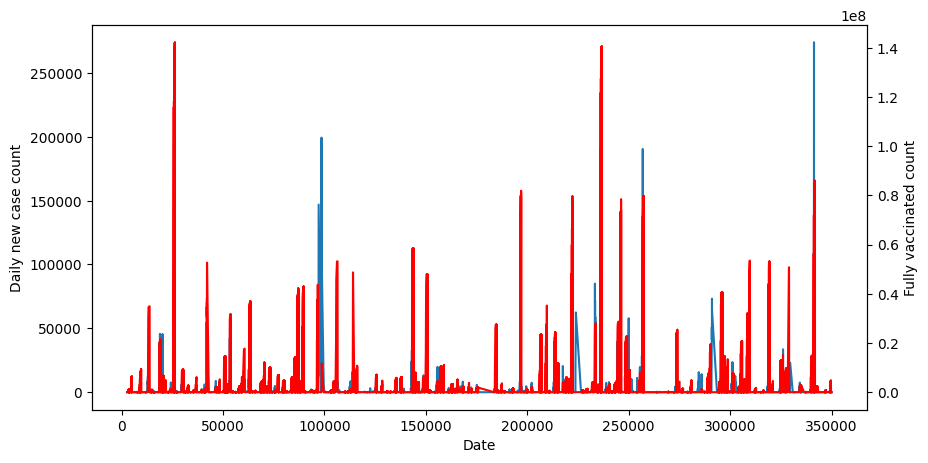

In [189]:
fig,ax = plt.subplots(figsize=(10,5))
ax.plot(df.index,df['new_cases_smoothed'])
ax.set_ylabel('Daily new case count')
ax1 = ax.twinx()
ax1.set_ylabel('Fully vaccinated count')
ax1.plot(df.index,df['people_fully_vaccinated'],'r-')
ax.set_xlabel('Date')

### icu_patients and daily_new_cases

Text(0.5, 0, 'Date')

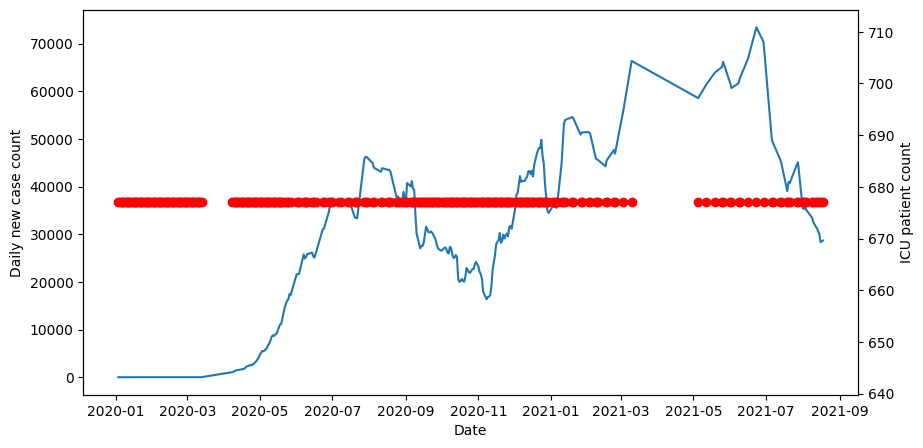

In [190]:
df_country = df.loc[df['location']=='Brazil']
df_country = df_country[['date','new_cases_smoothed','icu_patients']]

df_country.index = pd.to_datetime(df_country['date'])
df_country.drop(columns='date',inplace=True)
df_country

fig,ax = plt.subplots(figsize=(10,5))
ax.plot(df_country.index,df_country['new_cases_smoothed'])
ax.set_ylabel('Daily new case count')
ax1 = ax.twinx()
ax1.set_ylabel('ICU patient count')
ax1.plot(df_country.index,df_country['icu_patients'],'ro')
ax.set_xlabel('Date')

### new_cases in world map over time

In [191]:
for country in np.unique(df['location']):
    df_country = df.loc[df['location']==country]
    df_country = df_country.interpolate(method='ffill') #Forward fill: if 3rd data is 10 and 4th data is NAN, NAN data change into 10
    df.loc[df['location']==country] = df_country
    df_country = None

fig = px.choropleth(df, locations="location", locationmode = "country names", color="new_cases_smoothed", hover_name="location", animation_frame="date" , color_continuous_scale="Rainbow", range_color=(0.0, 1000.0))

fig.update_layout(title_text = 'New cases smoothed',
            title_x = 0.2,
            geo=dict(
                showframe = True,
                showcoastlines = False,
            ))
fig.show()

### Demographic Analysis

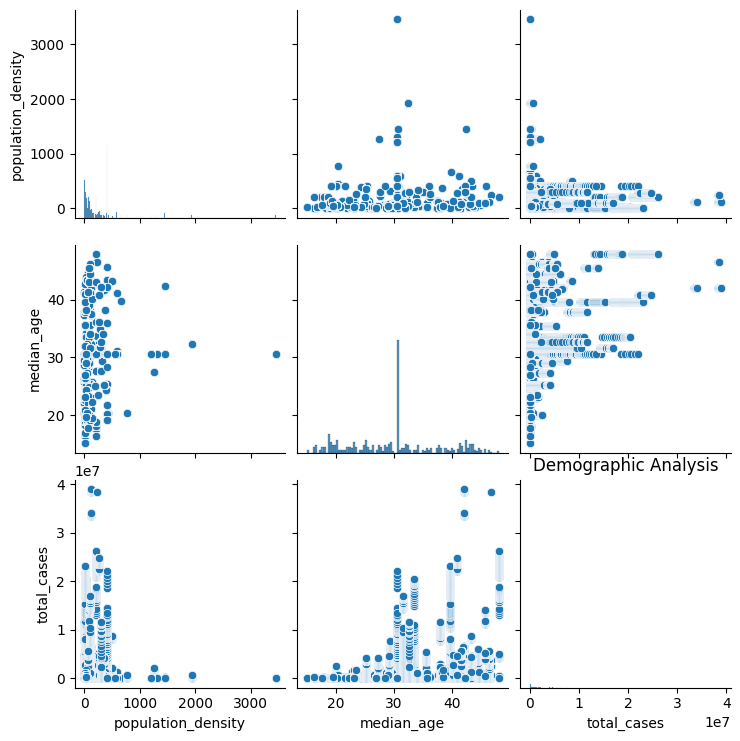

In [192]:
sns.pairplot(df[['population_density', 'median_age', 'total_cases']])
plt.title('Demographic Analysis')
plt.show()